In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import rcParams
import time
from copy import copy as dup
from scipy.integrate import odeint, solve_ivp, complex_ode
from numba import int64
from numba import int32

# import fourier as ft
# from sim_handling import Simulation

import diffusionstuff10 as ds

#for 3d plots
# from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
# from mpl_toolkits.mplot3d import Axes3D

# for saving animations
import pickle
from matplotlib import animation
from IPython.display import HTML

In [2]:
# Graphics parameters
%matplotlib widget
ticklabelsize = 11
fontsize = 15
linewidth = 2

In [3]:
#Setting up the system
nx = 500 # Number of points in simulation box
xmax = 150
x = np.linspace(0, xmax, nx)
boxpoints = len(x)
deltax = x[1]-x[0]
Nbar = 1.0 # new Nbar from VMD, 260K
Nstar = .9/(2*np.pi)
nmid = int(nx/2)
xmid = max(x)/2
xmax = x[nx-1]
L = xmax/2

# Just conversions
nmpermonolayer = 0.3
umpersec_over_mlyperus = (nmpermonolayer/1e3*1e6)

# Diffusion coefficient
# D = 1.6e-4 # micrometers^2/microsecond
D = 0.002

# Diffusion coefficient scaled for this time step and space step
Doverdeltax2 = D/deltax**2

# Time steps
# dtmaxtimefactor = 50
dtmaxtimefactor = .5
dtmax = deltax**2/D
t_init = 0.0
# t_max = 50000
# t_max = dtmax/dtmaxtimefactor
deltat = 20000#dtmax/dtmaxtimefactor
tspan = [t_init, t_init+deltat]

# Deposition rate
nu_kin = 250 # microns/second - about right for 260 K
nu_kin_mlyperus = nu_kin/umpersec_over_mlyperus # monolayers per microsecond

# Supersaturation
sigma0 = 0.19
sigmaIcorner = 0.21 # Must be bigger than sigma0 to get growth
center_reduction = 0.25 # In percent
c_r = center_reduction/100

# Overlying supersaturation
# sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='sinusoid')
sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='parabolic')

# odemethod = 'BDF'
odemethod = 'RK45'

# Reporting
print("D =", D, 'um^2/us',D * 1e-12*1e6*1e9, 'x 10^-9 m^2/sec')
print('deltat_max (Diffusion time) =', dtmax)
print('deltat =', deltat)
print('nu_kin_mlyperus =', nu_kin_mlyperus, 'monolayers/us')
print('nmid =', nmid)
print('N* =', Nstar)
print('N*x2pi =', Nstar*2*np.pi)
print('Nbar, Nbar-N*, N*/Nbar =', Nbar, Nbar-Nstar, Nstar/Nbar)
print('deltax =', deltax)
print('sigma_0 =', sigma0)
print('sigmaIcorner =', sigmaIcorner)
print('center reduction =', center_reduction, '%')
print('c_r =', c_r, 'dimensionless')
print('max growth rate =', nu_kin_mlyperus*sigmaIcorner*umpersec_over_mlyperus, 'um/sec')
print('min growth rate =', nu_kin_mlyperus*(sigmaIcorner-sigma0)*umpersec_over_mlyperus, 'um/sec')
print('nu_kin =', nu_kin, 'um/sec')
print('dx =', deltax)
print('L =', L, 'micrometers')

D = 0.002 um^2/us 2.0 x 10^-9 m^2/sec
deltat_max (Diffusion time) = 45.18054144360867
deltat = 20000
nu_kin_mlyperus = 0.8333333333333334 monolayers/us
nmid = 250
N* = 0.1432394487827058
N*x2pi = 0.9
Nbar, Nbar-N*, N*/Nbar = 1.0 0.8567605512172942 0.1432394487827058
deltax = 0.30060120240480964
sigma_0 = 0.19
sigmaIcorner = 0.21
center reduction = 0.25 %
c_r = 0.0025 dimensionless
max growth rate = 52.5 um/sec
min growth rate = 4.999999999999998 um/sec
nu_kin = 250 um/sec
dx = 0.30060120240480964
L = 75.0 micrometers


In [4]:
uselayers = True

# 1D run parameters
if uselayers:
    layermax = 1000
    # layermax=500
else:
    countermax = 15000

In [5]:
Ntot_init_1D = np.ones(nx)
NQLL_init_1D = ds.getNQLL(Ntot_init_1D,Nstar,Nbar)

tintervals = np.linspace(tspan[0],tspan[-1],2)#nx)

paramsarr = [Nbar, Nstar, sigmaI, sigma0, nu_kin_mlyperus, Doverdeltax2, nx] 

In [6]:
# oridt = ds.f1d_solve_ivp_1var(0,Ntot_init_1D,paramsarr)
# print(type(Ntot_init_1D))
# oridq = -Nstar * 2*np.pi * oridt * np.cos(2*np.pi*Ntot_init_1D)

# oridq = ds.f1d_solve_ivp_1var_QLL(0,NQLL_init_1D,paramsarr)

In [7]:
# original(ish) solution

# Initialize as a pre-equilibrated layer of liquid over ice
# Ntot_init_1D = np.ones(nx)

# Call the ODE solver
# ylast = np.array(Ntot_init_1D)
ylast = np.array(NQLL_init_1D)

counter = 0
layer = 0
ttot = 0.0

def f1d_rhs(t,y):
    return ds.f1d_solve_ivp_1var_QLL(t,y,paramsarr)
    # return ds.f1d_solve_ivp_1var(t,y,paramsarr)

# Integrate up to next time step
sol = solve_ivp(fun=f1d_rhs, t_span=[tintervals[0],tintervals[-1]], y0=ylast, t_eval=tintervals, rtol=1e-12, method=odemethod)
ykeep_1D = sol.y
tkeep_1D = sol.t

# print(sol.y)

c:\Users\elsla\IceResearch\icecontinuum\eslattery\diffusionstuff10.py:157: RuntimeWarning: invalid value encountered in sqrt
  dNqll = - 2*np.pi*nu_kin_mlyperus*sigma_m * np.sqrt(Nstar**2 - (Nbar - Nqll0)**2) ##THIS IS WRONG FIX IT


KeyboardInterrupt: 

In [ ]:
ykeep_1D = np.array(ykeep_1D, np.float64)

# Ntot = ykeep_1D
# NQLL = ds.getNQLL(Ntot,Nstar,Nbar)
NQLL = ykeep_1D
Ntot = 1/(2*np.pi) * np.arcsin((Nbar - NQLL)/Nstar)

tkeep_1Darr = np.array(tkeep_1D, np.float64)

# Nice = Ntot - NQLL

print(NQLL)
# print(np.arcsin((Nbar-NQLL)/Nstar))

[[1.         1.12688935 1.13867392 ... 1.14323935 1.14323947 1.14323943]
 [1.         1.12688769 1.13867307 ... 1.14323974 1.14323938 1.14323952]
 [1.         1.12688562 1.1386719  ... 1.14323897 1.14323956 1.14323933]
 ...
 [1.         1.12688562 1.1386719  ... 1.14323897 1.14323956 1.14323933]
 [1.         1.12688769 1.13867307 ... 1.14323974 1.14323938 1.14323952]
 [1.         1.12688935 1.13867392 ... 1.14323935 1.14323947 1.14323943]]


C:\Users\elsla\AppData\Local\Temp\ipykernel_5140\1030455114.py:6: RuntimeWarning: invalid value encountered in arcsin
  Ntot = 1/(2*np.pi) * np.arcsin((Nbar - NQLL)/Nstar)


[[1.         1.10231568 1.13165891 ... 1.00025549 1.13157154 1.14307843]

 [1.         1.10242137 1.13172488 ... 1.13754387 1.14066929 1.01958637]

 [1.         1.10252385 1.13179038 ... 1.10862126 1.14305508 1.13293101] 

 ... 
 [1.         1.10252385 1.13179038 ... 1.10862139 1.14305508 1.13293113] 

 [1.         1.10242137 1.13172488 ... 1.13754377 1.14066944 1.01959492] 

 [1.         1.10231568 1.13165891 ... 1.00025481 1.13157139 1.14307844]]

In [104]:
import scipy as sp

def fftnorm(u_full):
    """Computes normalized FFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete FFT is to be computed

    Returns
    -------
    normalizedFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """

    normalizedFFT = np.fft.rfft(u_full,norm = "forward")
    return normalizedFFT

def ifftnorm(u_full):
    """Computes normalized IFFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete IFFT is to be computed

    Returns
    -------
    normalizedIFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """
    

    normalizedIFFT = np.fft.irfft(u_full, norm = "forward")
    return normalizedIFFT

def nTotRHS(nTOTk,nu_kin_mlyperus,sigMk,k,D,Nstar):
    """Computes RHS of the ODE for the positive modes of Ntot
    dnk/dt = -k^2 D nkQLL + 2 pi FFT(sigma_m) nu_kin
    
    
    Parameters
    ----------
    nQLL : 1D Numpy Array (N,)
        Positive modes of state vector for quasi-liquid layers
        
    nu_kin_mlyperus : float
        Deposition rate in monolayers per microsecond
        
    sigMk : 1D Numpy Array (N,)
        Transformed sigmaM for positive modes k
        
    k : 1D Numpy Array (N,)
        Vector of wavenumbers
        
    D : float
        Diffusion coefficient

    Returns
    -------
    dnTot : 1D Numpy Array (N,)
        Rate of change of positive modes of nTot
    """

    dnTot = k**2 * D * Nstar * fftnorm(np.sin(2*np.pi * ifftnorm(nTOTk))) + nu_kin_mlyperus*sigMk
    return dnTot

def nQLLRHS(nQLLk,sigMk,params):
    D = params['D']
    nu_kin_mlyperus = params['nu_kin_mlyperus']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    k = params['k']

    conv = fftnorm(ifftnorm(sigMk) * (Nstar - ((Nbar - ifftnorm(nQLLk))**2)/Nstar))
    dnQLL = - k**2 * D*nQLLk - 2*np.pi*Nstar*nu_kin_mlyperus * conv
    return dnQLL
    

def RHS(t,n,params):
    """
    Computes the RHS for the 1 variable system. For use in solver.
    
    Parameters
    ----------
    t : float
        Current time
        
    n : Numpy array (N,)
        Current state vector of positive modes (only total)
              
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : 
        sigma0 : 
        sigmaI : 
        k : 
        D : 
        Nstar :
        Nbar : 

    Returns
    -------
    RHS : 1D Numpy array (N,)
          Derivative of each positive mode in state vector
    """
    
    # extract parameters from dictionary
    N = params['N']
    nu_kin_mlyperus = params['nu_kin_mlyperus']
    k = params['k']
    D = params['D']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    sigma0 = params['sigma0']
    sigmaI = params['sigmaI']
    
    # make sure nTot is size N, then find NQLL in real space
    # nTot = n[:N]
    # Nqll = ds.getNQLL(ifftnorm(nTot),Nstar,Nbar)
    # nQLL = fftnorm(Nqll)
    nQLL = n[:N]
    Nqll = ifftnorm(nQLL)
    
    # calc sigma M and transform
    sigmaM = ds.getsigmaM(Nqll,[Nbar,Nstar,sigmaI,sigma0])
    sigMk = fftnorm(sigmaM)

    # calc dnT and return as array
    # dnT = nTotRHS(nTot,nu_kin_mlyperus,sigMk,k,D,Nstar)
    dnQ = nQLLRHS(nQLL,sigMk,params)
    RHS = np.array(dnQ)
    return RHS


def runSim(params):
    """
    Runs a simulation of the ice continuum in Fourier space
    
    Parameters
    ----------
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : 
        sigmastep : 
        sigmastep_FFT : 
        k : 
        D : 
        
    Returns
    -------
    uSim : ODE solver output
           Output solution from sp.integrate.solve_ivp (includes state vector at all timesteps, time vector, etc.)
    """
    
    # unpack parameters from dictionary
    N = params['N']
    ICNT = params['ICNT']
    # ICNQ = params['ICNQ']
    tinterval = params['tinterval']
    
    # print(ICNT)
    
    # nTotIC = fftnorm(ICNT)[:N]
    # nQLLIC = fftnorm(ICNQ)[:N]
    nQLLIC = fftnorm(ds.getNQLL(ICNT,Nstar,Nbar))[:N]
    # print((nQLLIC))
    n = np.array(nQLLIC)
    
    # define RHS in form appropriate for solve_ivp
    def myRHS(t,y):
        out = RHS(t,y,params)
        return out

    solv = solve_ivp(fun=myRHS, t_span=[tinterval[0],tinterval[-1]], y0=n, t_eval = tinterval, rtol=1e-12, method=odemethod)

    # Call the ODE solver
    ykeep_ft = solv.y
    tkeep_ft = solv.t
    
    return [ykeep_ft,tkeep_ft]


def makeReal(fourierSol,params): 

    N = params['N']
    timesteps = fourierSol.shape[1]
    # NTot = np.zeros((timesteps,2*N-2))
    Nqll = np.zeros((timesteps,2*N-2))

    for i in range(timesteps):
        # NTot[i,:] = ifftnorm(fourierSol[:,i])
        Nqll[i,:] = ifftnorm(fourierSol[:,i])
        
    return Nqll

In [105]:
print("Starting a similar system")

N = int(nx/2 + 1)
# N = 64


if N > (nx/2 + 1):
    print("bad choice")

xf = np.linspace(x[0],xmax,2*N-2)
xfmid = max(xf)/2

Ntot_init = np.ones(2*N-2)
Nqll_init = ds.getNQLL(Ntot_init,Nstar,Nbar)

sigmaIft = ds.getsigmaI(xf,xmax,center_reduction,sigmaIcorner,method='parabolic')


params = {"N" : N,
          "Nstar" : Nstar,
          "nu_kin" : nu_kin,
          "nu_kin_mlyperus" : nu_kin_mlyperus,
          "Nbar" : Nbar,
          "sigma0" : sigma0,
          "sigmaI" : sigmaIft,
          "k" : np.arange(0,N),
          "D" : D/N,
          "ICNT" : Ntot_init_1D,
        #   "ICNQ" : Nqll_init,
          "tinterval":tintervals}


soln = runSim(params)
# print(soln)
# print('here')
realSoln = makeReal(soln[0],params)

Starting a similar system


In [108]:
# ykeep_ft = np.array(realSoln, np.float64)
# Ntotkeep_ft = realSoln[:]
# # print(realSoln)
# Nqllkeep_ft = ds.getNQLL(Ntotkeep_ft,Nstar,Nbar)

# NtotFinalFT = Ntotkeep_ft[-1]
# NqllFinalFT = Nqllkeep_ft[-1]

tkeep_ftarr = np.array(soln[1], np.float64)
# Nicekeep_ft = Ntotkeep_ft-Nqllkeep_ft
# NiceFinalFT = NtotFinalFT-NqllFinalFT

Nqllkeep_ft = realSoln[:]
Ntotkeep_ft = 1/(2*np.pi) * np.arcsin((Nbar - Nqllkeep_ft)/Nstar)
Nicekeep_ft = Ntotkeep_ft-Nqllkeep_ft

print(Nqllkeep_ft)

[[1.         1.         1.         ... 1.         1.         1.        ]
 [0.85676284 0.85676284 0.85676284 ... 0.85676284 0.85676284 0.85676284]
 [0.85676111 0.8567589  0.85676328 ... 0.85676328 0.8567589  0.85676111]
 ...
 [0.85676622 0.85675487 0.85676622 ... 0.85675487 0.85676622 0.85675487]
 [0.85675577 0.85676534 0.85675577 ... 0.85676534 0.85675577 0.85676534]
 [0.85675402 0.85676708 0.85675402 ... 0.85676708 0.85675402 0.85676708]]


C:\Users\elsla\AppData\Local\Temp\ipykernel_4876\1125702620.py:14: RuntimeWarning: invalid value encountered in arcsin
  Ntotkeep_ft = 1/(2*np.pi) * np.arcsin((Nbar - Nqllkeep_ft)/Nstar)


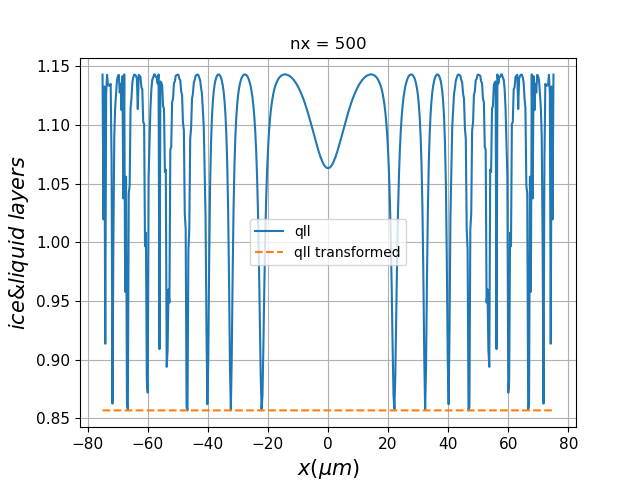

In [107]:
colorIce = 'k'
colorTot = 'b'
colorSteps = 'cyan'
colorT = 'red'

a = -1

plt.figure()
plt.title('nx = ' + str(nx))
plt.plot(x-xmid, NQLL[:,a], label='qll')
# plt.plot(x-xmid, Nice[:,a], color=colorIce, label='ice', lw=linewidth,linestyle='-')
# plt.plot(x-xmid, Ntot[:,a], color=colorTot, label='ice+liquid', lw=linewidth,linestyle='-')
plt.plot(xf-xfmid,Nqllkeep_ft[a], label='qll transformed',linestyle='--')
# plt.plot(xf-xfmid, Nicekeep_ft[a], color=colorT, label='ice transformed', linestyle='--')
# plt.plot(xf-xfmid, Ntotkeep_ft[a], color='purple', label='ice+liquid transformed', linestyle='--')
plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$ice & liquid \ layers$',fontsize=fontsize)
# plt.xlim([-xmid, xmid])
# plt.ylim([0,550])
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.legend()
plt.grid('on')

Text(0, 0.5, 'Number of steps')

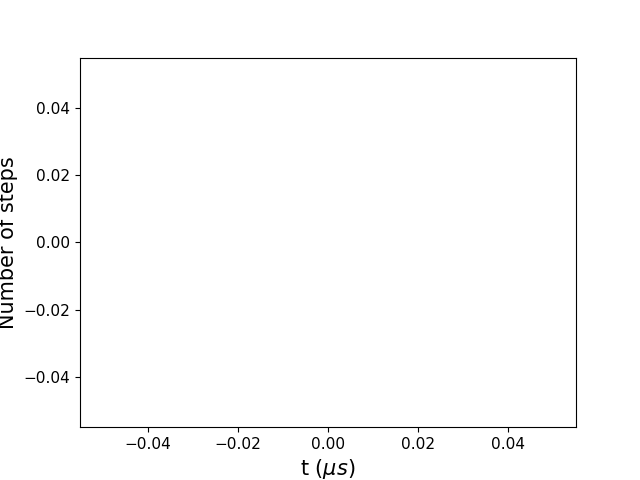

In [33]:
plt.figure()
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
f = np.max(Ntotkeep_ft,axis=1) - np.min(Ntotkeep_ft,axis=1)
plt.plot(tkeep_1D,f,lw=linewidth)
plt.xlabel(r't ($\mu s$)',fontsize=fontsize)
plt.ylabel('Number of steps',fontsize=fontsize)

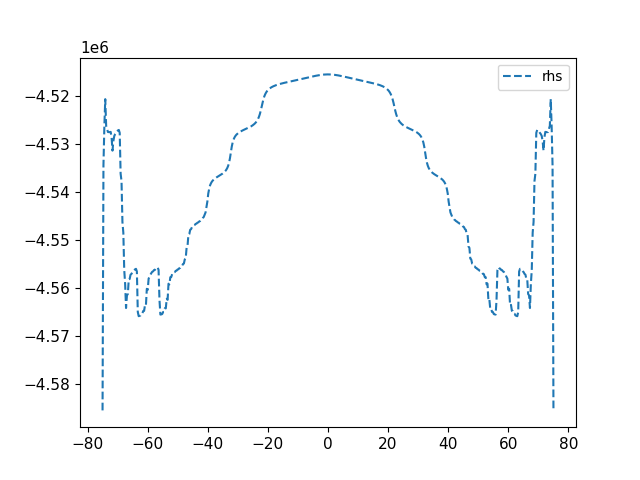

In [74]:
testy = Ntot[:,-1]
testn = fftnorm(testy)[:N]

rhstest = RHS(tintervals[-1],testn,params)
rhsreals = ifftnorm(rhstest)
f1degTOT = ds.f1d_solve_ivp_1var(tintervals[-1],testy,paramsarr)

plt.figure()
# plt.plot(x-xmid,f1deg-rhsreals,label='f1d')
plt.plot(xf-xfmid,rhsreals,label='rhs',linestyle='--')
plt.legend()

In [61]:
## animation of ntot original and transformed solution

myFig = plt.figure()
ax = plt.subplot()
ax.set_title('Ntot')
ax.axis(xmin = xf[0]-xmid,xmax = xf[-1]-xmid)#,ymin = -1, ymax = 5)
# create initial frames
lineList = [ax.plot([],[]) for i in range (2)]
lineList[0] = ax.plot(xf - xmid,Ntotkeep_ft[0,:],linestyle='--',label='transformed Ntot',color='red')
lineList[1] = ax.plot(x-xmid,Ntot[:,0],label='original Ntot',color='blue')
# define function to draw each frame
def makeFrame(n):
    lineList[0][0].set_data(xf - xmid,Ntotkeep_ft[n])
    lineList[1][0].set_data(x-xmid, Ntot[:,n])
    return lineList
ax.legend()

# generate animations
anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_ftarr))

plt.close()
HTML(anim1.to_jshtml())